# **Group Assignment** - Bike Sharing

- `instant`: record index
- `dteday` : date
- `season` : season 1:winter, 2:spring, 3:summer, 4:fall
- `yr` : year (0: 2011, 1:2012)
- `mnth` : month ( 1 to 12)
- `hr` : hour (0 to 23)
- `holiday` : weather day is holiday or not (extracted from http://dchr.dc.gov/page/holiday-schedule)
- `weekday` : day of the week
- `workingday` : if day is neither weekend nor holiday is 1, otherwise is 0.
+ `weathersit` : 
	- 1: Clear, Few clouds, Partly cloudy, Partly cloudy
	- 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist
	- 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds
	- 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog
- `temp` : Normalized temperature in Celsius. The values are divided to 41 (max)
- `atemp`: Normalized feeling temperature in Celsius. The values are divided to 50 (max)
- `hum`: Normalized humidity. The values are divided to 100 (max)
- `windspeed`: Normalized wind speed. The values are divided to 67 (max)
- `casual`: count of casual users
- `registered`: count of registered users
- `cnt`: count of total rental bikes including both casual and registered

## PART I: Exploratory Data Analysis

In [1]:
import pandas as pd
import numpy as np
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [2]:
data = pd.read_csv('bike-sharing-hourly.csv')
print(f"Shape of the dataset: {data.shape} \n")
data.head()

Shape of the dataset: (17379, 17) 



,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


### Ensuring data quality

In [3]:
# check the data types
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     17379 non-null  int64  
 1   dteday      17379 non-null  object 
 2   season      17379 non-null  int64  
 3   yr          17379 non-null  int64  
 4   mnth        17379 non-null  int64  
 5   hr          17379 non-null  int64  
 6   holiday     17379 non-null  int64  
 7   weekday     17379 non-null  int64  
 8   workingday  17379 non-null  int64  
 9   weathersit  17379 non-null  int64  
 10  temp        17379 non-null  float64
 11  atemp       17379 non-null  float64
 12  hum         17379 non-null  float64
 13  windspeed   17379 non-null  float64
 14  casual      17379 non-null  int64  
 15  registered  17379 non-null  int64  
 16  cnt         17379 non-null  int64  
dtypes: float64(4), int64(12), object(1)
memory usage: 2.3+ MB


In [4]:
# We just need to convert 'dteday' 
data['dteday'] = pd.to_datetime(data['dteday'])

In [5]:
# Nulls double-check
data.isna().mean()

instant       0.0
dteday        0.0
season        0.0
yr            0.0
mnth          0.0
hr            0.0
holiday       0.0
weekday       0.0
workingday    0.0
weathersit    0.0
temp          0.0
atemp         0.0
hum           0.0
windspeed     0.0
casual        0.0
registered    0.0
cnt           0.0
dtype: float64

In [6]:
# looking for duplicates
data.duplicated().sum()

0

In [7]:
# checking how categorical values are distributed
categorical_columns = ['season', 'yr', 'mnth', 'hr', 'holiday', 'weekday', 'workingday', 'weathersit']
categorical_uniques = {column: data[column].unique() for column in categorical_columns}
categorical_uniques

{'season': array([1, 2, 3, 4], dtype=int64),
 'yr': array([0, 1], dtype=int64),
 'mnth': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12], dtype=int64),
 'hr': array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23], dtype=int64),
 'holiday': array([0, 1], dtype=int64),
 'weekday': array([6, 0, 1, 2, 3, 4, 5], dtype=int64),
 'workingday': array([0, 1], dtype=int64),
 'weathersit': array([1, 2, 3, 4], dtype=int64)}

In [8]:
# Funcion for plotting histograms
def plot_histograms_with_kde(df, columns, bins=30):
    num_rows = len(columns) // 3 + (len(columns) % 3 > 0)

    fig = make_subplots(rows=num_rows, cols=3, subplot_titles=[f'Histogram of {col}' for col in columns])

    for i, col in enumerate(columns):
        row = i // 3 + 1
        col_pos = i % 3 + 1

        # Histogram
        fig.add_trace(
            go.Histogram(
                x=df[col], 
                nbinsx=bins,
                name=f'{col} Histogram',
                histnorm='probability density',
            ),
            row=row, 
            col=col_pos
        )

        # KDE
        kde_data = df[col]
        kde = np.histogram(kde_data, bins=bins, density=True)
        kde_x = (kde[1][:-1] + kde[1][1:]) / 2 
        kde_y = kde[0]

        fig.add_trace(
            go.Scatter(
                x=kde_x, 
                y=kde_y, 
                mode='lines',
                name=f'{col} KDE',
                line=dict(shape='spline') 
            ),
            row=row, 
            col=col_pos
        )
    
        fig.update_xaxes(title_text=col, row=row, col=col_pos)
        fig.update_yaxes(title_text="Density", row=row, col=col_pos)
    
    fig.update_layout(
        showlegend=False,
        title_text="Histograms with KDE of Numerical Columns",
        height=300*num_rows,
        width=900
    )
    
    fig.show()

# Function for boxplot:    
def plot_boxplots(df, columns):
    num_rows = len(columns) // 3 + (len(columns) % 3 > 0)
    fig = make_subplots(rows=num_rows, cols=3, subplot_titles=[f'Box Plot of {col}' for col in columns])

    for i, col in enumerate(columns):
        row = i // 3 + 1
        col_pos = i % 3 + 1
        fig.add_trace(
            go.Box(y=df[col], name=col),
            row=row, col=col_pos
        )

    fig.update_layout(showlegend=False, title_text="Box Plots of numerical columns")
    fig.update_layout(height=300*num_rows, width=900)
    
    fig.show()

In [9]:
# statistical description of the variables
data.describe().T

,count,mean,std,min,25%,50%,75%,max
instant,17379.0,8690.000000,5017.029500,1.00,4345.5000,8690.0000,13034.5000,17379.0000
season,17379.0,2.501640,1.106918,1.00,2.0000,3.0000,3.0000,4.0000
yr,17379.0,0.502561,0.500008,0.00,0.0000,1.0000,1.0000,1.0000
mnth,17379.0,6.537775,3.438776,1.00,4.0000,7.0000,10.0000,12.0000
hr,17379.0,11.546752,6.914405,0.00,6.0000,12.0000,18.0000,23.0000
holiday,17379.0,0.028770,0.167165,0.00,0.0000,0.0000,0.0000,1.0000
weekday,17379.0,3.003683,2.005771,0.00,1.0000,3.0000,5.0000,6.0000
workingday,17379.0,0.682721,0.465431,0.00,0.0000,1.0000,1.0000,1.0000
weathersit,17379.0,1.425283,0.639357,1.00,1.0000,1.0000,2.0000,4.0000
temp,17379.0,0.496987,0.192556,0.02,0.3400,0.5000,0.6600,1.0000


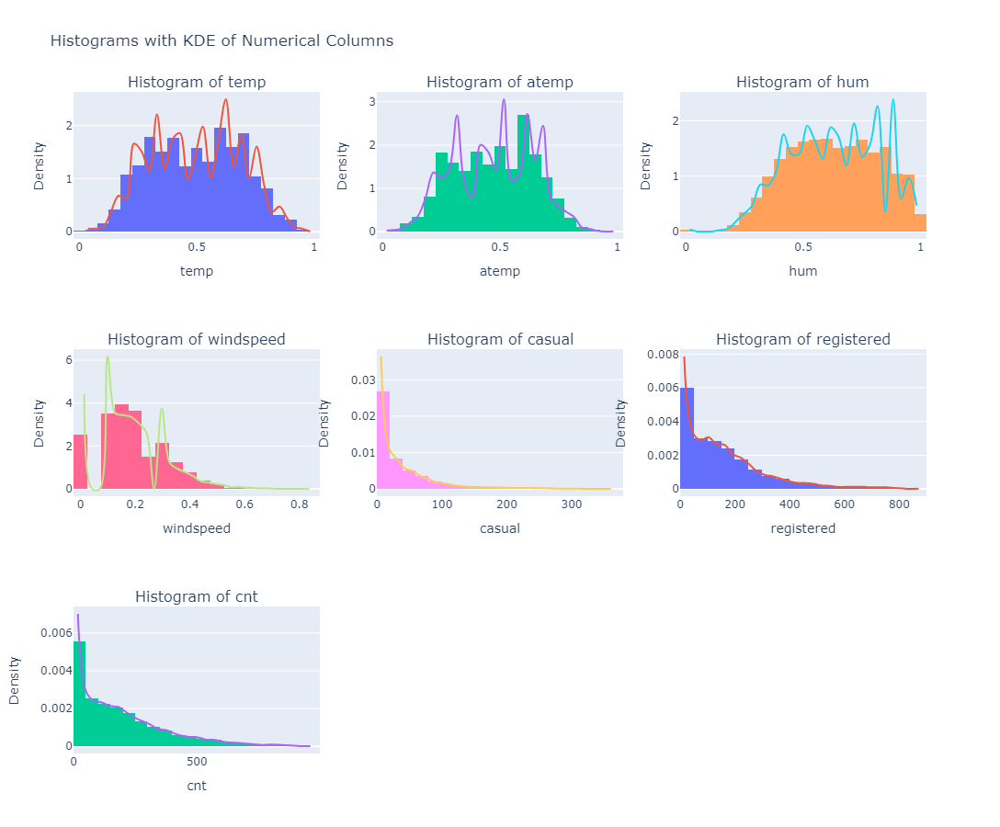

In [10]:
numerical_columns = ['temp', 'atemp', 'hum', 'windspeed', 'casual', 'registered', 'cnt']

plot_histograms_with_kde(data, numerical_columns)

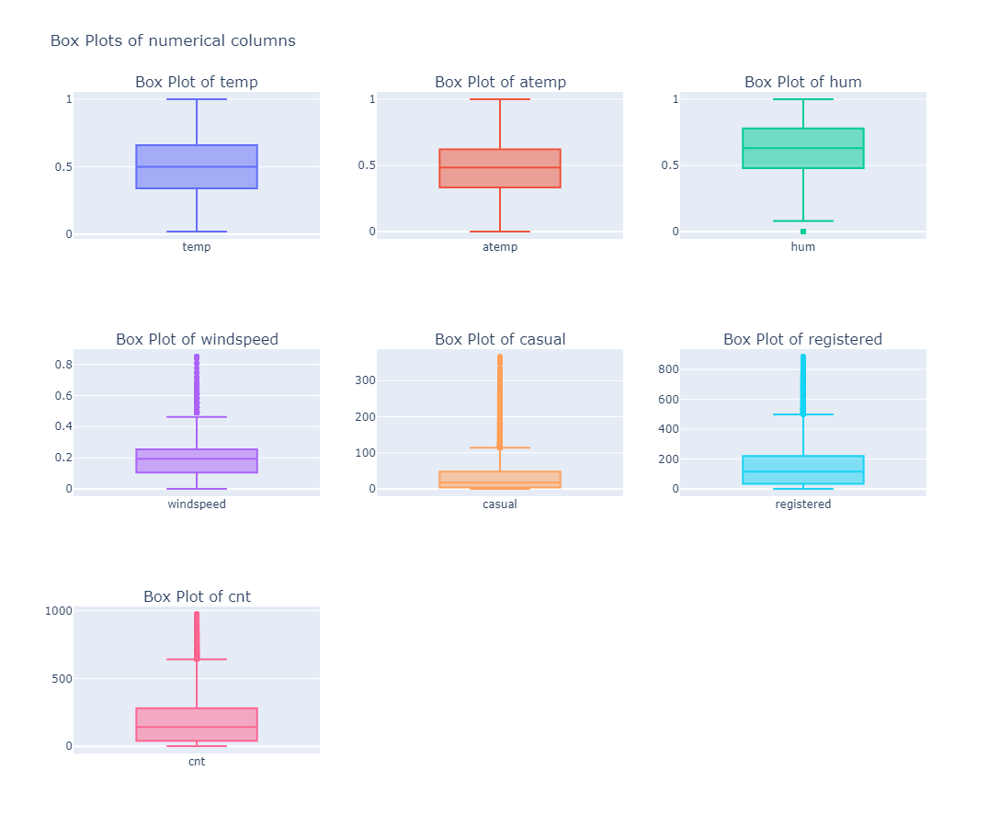

In [11]:
plot_boxplots(data, numerical_columns)

### More plotting

In [13]:
fig = px.line(data, x=data['instant'], y=['registered', 'casual'], title='Time Series of Casual and Registered Bike Counts')
fig.update_xaxes(title_text='Date')
fig.update_yaxes(title_text='Count')
fig.update_layout(legend_title='User Type')

# Show the figure
fig.show()

In [14]:
# Group the data by 'hr', 'weekday', and 'mnth' and calculate the average counts
average_counts = data.groupby(['hr', 'weekday', 'mnth'])[['casual', 'registered']].mean().reset_index()

# Create a heatmap for 'hr' vs. 'weekday' with 'casual' counts
fig1 = go.Figure(data=go.Heatmap(
    x=average_counts['hr'],
    y=average_counts['weekday'],
    z=average_counts['casual'],
    colorscale='Viridis',
    colorbar_title='Average Casual Counts',
))
fig1.update_layout(
    title='Average Casual Bike Counts per Hour and Weekday',
    xaxis=dict(title='Hour of the Day'),
    yaxis=dict(title='Weekday'),
)

# Create a heatmap for 'hr' vs. 'weekday' with 'registered' counts
fig2 = go.Figure(data=go.Heatmap(
    x=average_counts['hr'],
    y=average_counts['weekday'],
    z=average_counts['registered'],
    colorscale='Viridis',
    colorbar_title='Average Registered Counts',
))
fig2.update_layout(
    title='Average Registered Bike Counts per Hour and Weekday',
    xaxis=dict(title='Hour of the Day'),
    yaxis=dict(title='Weekday'),
)

# Create a heatmap for 'hr' vs. 'mnth' with 'casual' counts
fig3 = go.Figure(data=go.Heatmap(
    x=average_counts['hr'],
    y=average_counts['mnth'],
    z=average_counts['casual'],
    colorscale='Viridis',
    colorbar_title='Average Casual Counts',
))
fig3.update_layout(
    title='Average Casual Bike Counts per Hour and Month',
    xaxis=dict(title='Hour of the Day'),
    yaxis=dict(title='Month'),
)

# Create a heatmap for 'hr' vs. 'mnth' with 'registered' counts
fig4 = go.Figure(data=go.Heatmap(
    x=average_counts['hr'],
    y=average_counts['mnth'],
    z=average_counts['registered'],
    colorscale='Viridis',
    colorbar_title='Average Registered Counts',
))
fig4.update_layout(
    title='Average Registered Bike Counts per Hour and Month',
    xaxis=dict(title='Hour of the Day'),
    yaxis=dict(title='Month'),
)

# Show the figures
fig1.show()
fig2.show()
fig3.show()
fig4.show()

In [15]:
weather_labels = {
    1: 'Clear',
    2: 'Mist',
    3: 'Light Precipitation',
    4: 'Heavy Precipitation'
}

data['weather_situation'] = data['weathersit'].map(weather_labels)

average_counts = data.groupby('weather_situation')[['casual', 'registered']].mean().reset_index()

fig = px.bar(average_counts, x='weather_situation', y=['casual', 'registered'],
             title='Average Casual and Registered Bike Rentals by Weather Situation',
             labels={'casual': 'Average Casual Counts', 'registered': 'Average Registered Counts'},
             category_orders={'weather_situation': list(weather_labels.values())},
             barmode='group')
fig.update_xaxes(title_text='Weather Situation')
fig.update_yaxes(title_text='Average Count of Users')

fig.show()

In [16]:
average_counts = data.groupby('workingday')[['casual', 'registered']].mean().reset_index()

average_counts['workingday'] = average_counts['workingday'].map({0: 'Not a Workday', 1: 'Workday'})

fig = px.bar(average_counts, x='workingday', y=['casual', 'registered'],
             title='Comparison of Average Casual and Registered Users by Workday',
             labels={'casual': 'Average Casual Users', 'registered': 'Average Registered Users'},
             category_orders={'workingday': ['Not a Workday', 'Workday']})
fig.update_xaxes(title_text='Workday')
fig.update_yaxes(title_text='Average Count of Users')

fig.show()

In [17]:
data['day of the week'] = data['dteday'].dt.day_name()

average_counts = data.groupby('day of the week')[['casual', 'registered']].mean().reset_index()

fig = px.bar(average_counts, x='day of the week', y=['casual', 'registered'],
             title='Comparison of Average Casual and Registered Users by Day of the Week',
             labels={'casual': 'Average Casual Users', 'registered': 'Average Registered Users'},
             category_orders={'day of the week': ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']},
             barmode='group')
fig.update_xaxes(title_text='Day of the Week')
fig.update_yaxes(title_text='Average Count of Users')

fig.show()

In [18]:
average_counts = data.groupby('hr')[['casual', 'registered']].mean().reset_index()

fig = px.bar(average_counts, x='hr', y=['casual', 'registered'],
             title='Comparison of Average Casual and Registered Users by Hour',
             labels={'casual': 'Average Casual Users', 'registered': 'Average Registered Users'},
             category_orders={'hr': sorted(data['hr'].unique())},
             barmode='group')
fig.update_xaxes(title_text='Hour of the Day')
fig.update_yaxes(title_text='Average Count of Users')

fig.show()

In [19]:
# Group the data by 'weekday', 'mnth', and 'hr' and calculate the average 'cnt'
average_cnt = data.groupby(['weekday', 'mnth', 'hr'])['cnt'].mean().reset_index()

# Create a bar plot for 'weekday' vs. average 'cnt'
fig1 = px.bar(average_cnt, x='weekday', y='cnt', title='Average Bike Sharing by Weekday')
fig1.update_xaxes(title_text='Weekday')
fig1.update_yaxes(title_text='Average Count of Total Rental Bikes')

# Create a bar plot for 'mnth' vs. average 'cnt'
fig2 = px.bar(average_cnt, x='mnth', y='cnt', title='Average Bike Sharing by Month')
fig2.update_xaxes(title_text='Month')
fig2.update_yaxes(title_text='Average Count of Total Rental Bikes')

# Create a bar plot for 'hr' vs. average 'cnt'
fig3 = px.bar(average_cnt, x='hr', y='cnt', title='Average Bike Sharing by Hour')
fig3.update_xaxes(title_text='Hour of the Day')
fig3.update_yaxes(title_text='Average Count of Total Rental Bikes')

# Show the figures
fig1.show()
fig2.show()
fig3.show()

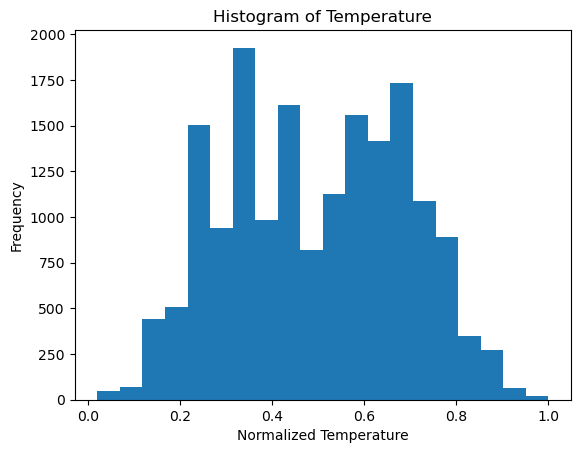

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns

# Example: Histogram of 'temp'
plt.hist(data['temp'], bins=20)
plt.xlabel('Normalized Temperature')
plt.ylabel('Frequency')
plt.title('Histogram of Temperature')
plt.show()

import plotly.graph_objects as go

# Example: Box plot of 'weathersit' vs. 'cnt' using Plotly
fig = go.Figure()

# Create a box plot for each weather situation
for weather_situation in data['weathersit'].unique():
    subset = data[data['weathersit'] == weather_situation]
    fig.add_trace(go.Box(y=subset['cnt'], name=f'Weather Situation {weather_situation}'))

fig.update_layout(
    xaxis=dict(title='Weather Situation'),
    yaxis=dict(title='Count of Total Rental Bikes'),
    title='Box Plot of Weather Situation vs. Rental Bikes'
)

# Show the figure
fig.show()



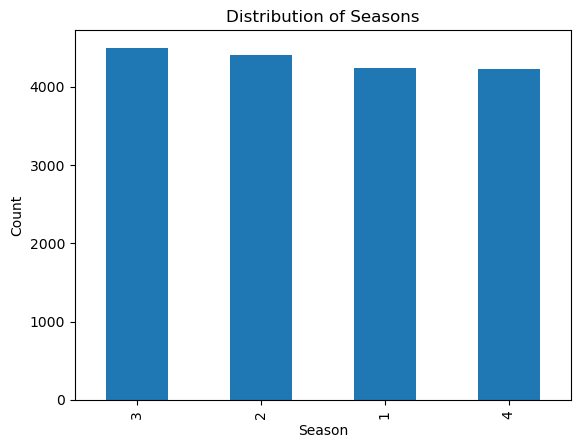

In [21]:
# Example: Bar plot of 'season'
data['season'].value_counts().plot(kind='bar')
plt.xlabel('Season')
plt.ylabel('Count')
plt.title('Distribution of Seasons')
plt.show()


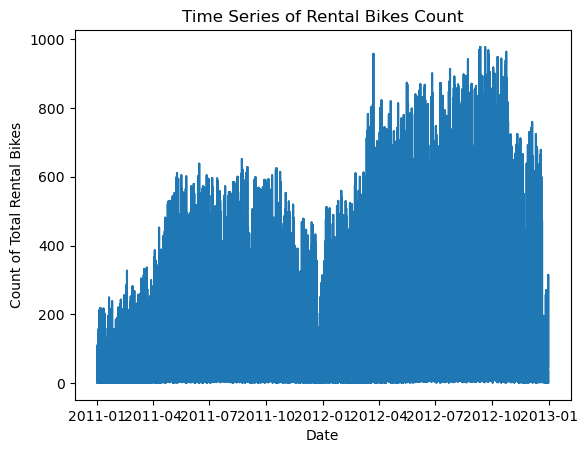

In [22]:
# Example: Time series plot of 'cnt'
# dates = pd.to_datetime(data['dteday'])
# data.set_index('dteday', inplace=True)
plt.plot(data['dteday'], data['cnt'])
plt.xlabel('Date')
plt.ylabel('Count of Total Rental Bikes')
plt.title('Time Series of Rental Bikes Count')
plt.show()


In [23]:
import plotly.graph_objects as go

# Example: Time series plot of 'cnt' using Plotly
fig = go.Figure()
fig.add_trace(go.Scatter(x=data.index, y=data['cnt'], mode='lines', name='Count of Total Rental Bikes'))
fig.update_xaxes(title_text='Date')
fig.update_yaxes(title_text='Count of Total Rental Bikes')
fig.update_layout(title='Time Series of Rental Bikes Count')

# Show the figure
fig.show()


In [24]:
import plotly.express as px
import pandas as pd

# Group the data by 'weekday', 'mnth', and 'hr' and calculate the total 'cnt'
total_cnt = data.groupby(['weekday', 'mnth', 'hr'])['cnt'].sum().reset_index()

# Create a bar plot for 'weekday' vs. total 'cnt'
fig1 = px.bar(total_cnt, x='weekday', y='cnt', title='Total Bike Sharing by Weekday')
fig1.update_xaxes(title_text='Weekday')
fig1.update_yaxes(title_text='Total Count of Total Rental Bikes')

# Create a bar plot for 'mnth' vs. total 'cnt'
fig2 = px.bar(total_cnt, x='mnth', y='cnt', title='Total Bike Sharing by Month')
fig2.update_xaxes(title_text='Month')
fig2.update_yaxes(title_text='Total Count of Total Rental Bikes')

# Create a bar plot for 'hr' vs. total 'cnt'
fig3 = px.bar(total_cnt, x='hr', y='cnt', title='Total Bike Sharing by Hour')
fig3.update_xaxes(title_text='Hour of the Day')
fig3.update_yaxes(title_text='Total Count of Total Rental Bikes')

# Show the figures
fig1.show()
fig2.show()
fig3.show()


In [25]:
import pandas as pd
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
# Create subplots
fig = make_subplots(rows=2, cols=2, subplot_titles=('Histogram of Temperature', 'Box Plot of Weather Situation vs. Rental Bikes'))

# Plot 1: Histogram of 'temp'
histogram = px.histogram(data, x='temp', title='Histogram of Temperature', nbins=20)
fig.add_trace(histogram.data[0], row=1, col=1)

# Plot 2: Box plot of 'weathersit' vs. 'cnt'
box_plot = px.box(data, x='weathersit', y='cnt', title='Box Plot of Weather Situation vs. Rental Bikes', labels={'cnt': 'Count of Total Rental Bikes'})
fig.add_trace(box_plot.data[0], row=1, col=2)

# Update subplot axes labels and titles
fig.update_xaxes(title_text='Normalized Temperature', row=1, col=1)
fig.update_yaxes(title_text='Frequency', row=1, col=1)
fig.update_xaxes(title_text='Weather Situation', row=1, col=2)
fig.update_yaxes(title_text='Count of Total Rental Bikes', row=1, col=2)

# Show the figure
fig.show()


### Feature engineering

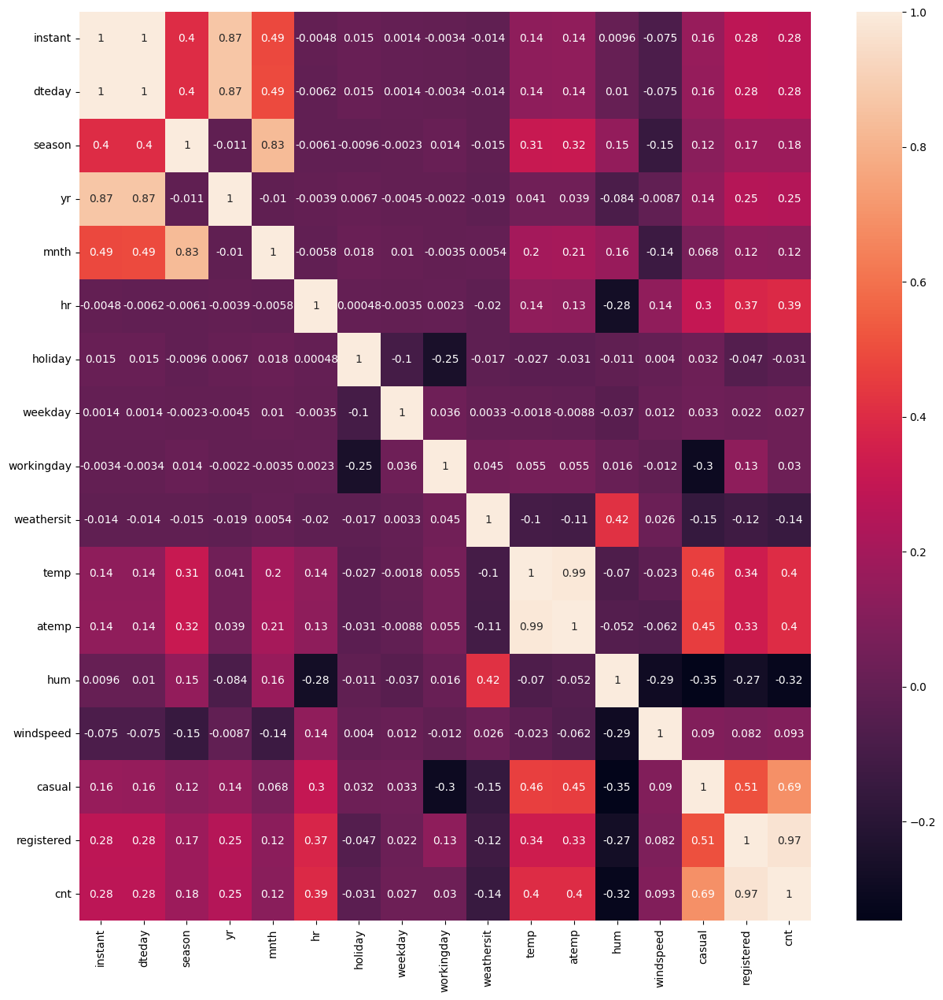

In [8]:
plt.figure(figsize=(15,15))
sns.heatmap(data=data.corr(), annot=True)
plt.show()

In [9]:
# Hours of Daylight
data['daylight_hours'] = data['hr'].apply(lambda x: 1 if (x >= 6 and x <= 19) else 0)

# Combination of Features (Apparent Temperature)
# data['apparent_temp'] = data['temp'] - (0.65 * data['hum'])

# Quantization/Binarization (High and Low Humidity)
data['high_humidity'] = data['hum'].apply(lambda x: 1 if x >= 0.75 else 0)

# Polynomial Features (Squared and Cubed Temperature)
data['temp_squared'] = data['temp'] ** 2

#rolling average of total count
data['rolling_avg_cnt'] = data['cnt'].rolling(window=3).mean()
data['rolling_avg_cnt'].fillna(0, inplace=True)

data['Week_Work'] = np.where(((data['weekday'] == 1) |(data['weekday'] == 2) |(data['weekday'] == 3) | (data['weekday'] == 4) | (data['weekday'] == 5)) & data['daylight_hours'] == 1, 1, 0)

# between data_squared and temp_cubed, we are removing data_cubed since it has a lower correlation with cnt and may cause redundancy problems
# we are also removing holiday and windspeed because of a extremly low correlation

In [10]:
def encode_cyclical(data, col, max_val):
    data[col + '_sin'] = np.sin(2 * np.pi * data[col] / max_val)
    data[col + '_cos'] = np.cos(2 * np.pi * data[col] / max_val)
    return data

data = encode_cyclical(data, 'hr', 23)

In [ ]:
# remove_low_correlation_columns(data, target_column='cnt', threshold=0.1)

C:\Users\lggas\AppData\Local\Temp\ipykernel_6204\1069525008.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data=data.corr(), annot=True)


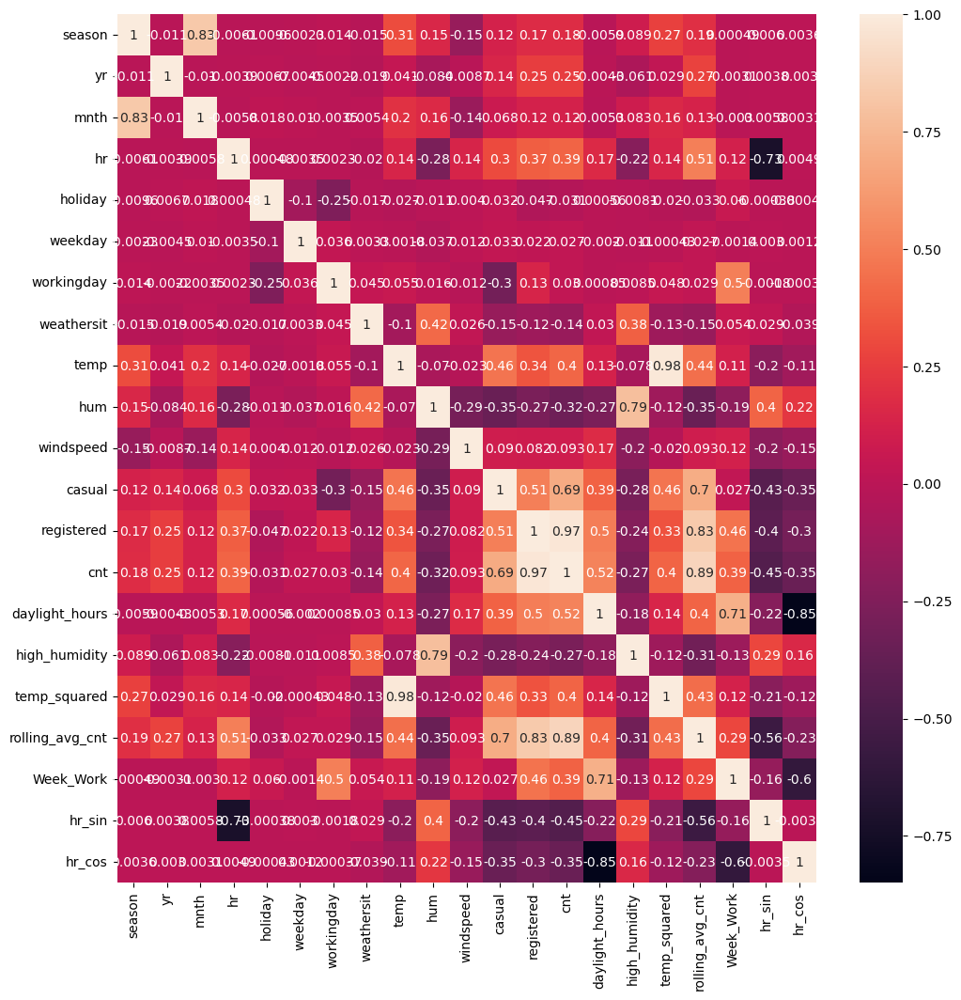

In [7]:
plt.figure(figsize=(12,12))
sns.heatmap(data=data.corr(), annot=True)
plt.show()

In [6]:
# data.drop(columns=['instant', 'atemp'], inplace = True)

In [11]:
data.head()

,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,...,casual,registered,cnt,daylight_hours,high_humidity,temp_squared,rolling_avg_cnt,Week_Work,hr_sin,hr_cos
0,2011-01-01,1,0,1,0,0,6,0,1,0.24,...,3,13,16,0,1,0.0576,0.000000,0,0.000000,1.000000
1,2011-01-01,1,0,1,1,0,6,0,1,0.22,...,8,32,40,0,1,0.0484,0.000000,0,0.269797,0.962917
2,2011-01-01,1,0,1,2,0,6,0,1,0.22,...,5,27,32,0,1,0.0484,29.333333,0,0.519584,0.854419
3,2011-01-01,1,0,1,3,0,6,0,1,0.24,...,3,10,13,0,1,0.0576,28.333333,0,0.730836,0.682553
4,2011-01-01,1,0,1,4,0,6,0,1,0.24,...,0,1,1,0,1,0.0576,15.333333,0,0.887885,0.460065


In [21]:
# data.to_csv('data.csv', index=False)

## PART II: Prediction Model

#### XGBoost Model

In [55]:
features = ['season', 'mnth', 'holiday', 'weekday', 'workingday','weathersit', 'temp', 'hum', 'daylight_hours', 'hr_sin', 'hr_cos']

X = data[features]
y = data['cnt']

# Splitting the data
# For Experiment 1, we'll use 90% of the data for training and 10% for testing
train_size = int(0.7 * len(data))
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Saving the last 7 days data as "future data"
X_future = X_test[-168:]
y_future = y_test[-168:]

In [19]:
# pip install xgboost

In [20]:
from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV, cross_val_score, train_test_split, GridSearchCV, TimeSeriesSplit
from sklearn.metrics import mean_absolute_percentage_error as metric
from sklearn.metrics import make_scorer

In [21]:
model = XGBRegressor(random_state=0)

param_distributions = {
    'n_estimators': [10, 50],
    'learning_rate': [0.3, 0.8],
    'gamma': [0],
    'max_depth': [20, 40], 
    'min_child_weight': [1, 10],
    'subsample': [0.1, 0.5],
    'num_parallel_tree': [1, 20], 
}

param_distributions = {
    'n_estimators': [50, 100],  
    'learning_rate': [0.3, 0.8],  
    'gamma': [1, 2.5], 
    'max_depth': [1, 5, 20, 50],  
    'min_child_weight': [1, 10, 20, 50],  
    'subsample': [0.3, 0.5],  
    'num_parallel_tree': [1, 5, 10], 
}

# Define the scorer
mape_scorer = make_scorer(metric, greater_is_better=False)

# Set up RandomizedSearchCV
random_search_xgb = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_distributions,
    n_iter=35,
    scoring=mape_scorer,
    cv=TimeSeriesSplit(n_splits=15),  
    verbose=1,
    random_state=0,
    refit=True,               
    n_jobs=-1,                
    return_train_score=True,
)

# Run the random search
random_search_xgb.fit(X_train, y_train)

Fitting 15 folds for each of 35 candidates, totalling 525 fits


RandomizedSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=15, test_size=None),
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, device=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=None, grow_policy=N...
                                          random_state=0, ...),
                   n_iter=35, n_jobs=-1,
                   param_distributions={'gamma': [1, 2.5],
                                        'learning_rate': [0.3, 0.8],
                                        'max_depth': [1, 5, 20, 50],
                                        'min_child_weight': [1, 10, 20, 50],
                                        'n_estimators': [50, 100],
                                        'num_parallel_tree': [1, 5, 10],
                                        'subsample': [0.3, 0.5]},
                   random_state=0, return_train_score=True,
                   scoring=make_scorer(mean_absolute_percentage_error, greater_is_better=False),
                   verbose=1)

In [57]:
best_xgb = random_search_xgb.best_params_
best_xgb

{'subsample': 0.5,
 'num_parallel_tree': 10,
 'n_estimators': 50,
 'min_child_weight': 10,
 'max_depth': 20,
 'learning_rate': 0.3,
 'gamma': 1}

In [23]:
results = random_search_xgb.cv_results_
results = pd.DataFrame(results)
results.T

,0,1,2,3,4,5,6,7,8,9,...,25,26,27,28,29,30,31,32,33,34
mean_fit_time,0.237332,1.315155,5.118501,0.74464,2.034871,2.624542,5.822473,0.110126,2.064237,0.106802,...,1.311571,2.554437,0.278846,0.313541,3.721799,1.928453,0.676269,1.690249,1.143996,0.129043
std_fit_time,0.087693,0.800533,2.850354,0.458061,1.179281,1.537953,3.498384,0.041489,1.202524,0.04019,...,0.6461,1.2322,0.141429,0.130975,2.10081,0.987841,0.378741,0.886408,0.588656,0.054502
mean_score_time,0.008967,0.026825,0.06776,0.009497,0.01803,0.025932,0.053681,0.007243,0.014906,0.007584,...,0.013069,0.020636,0.009794,0.011771,0.06147,0.022593,0.010998,0.022525,0.018581,0.007969
std_score_time,0.007501,0.014639,0.027025,0.008805,0.006798,0.009953,0.026259,0.007236,0.007898,0.00734,...,0.009073,0.008935,0.007307,0.010453,0.034781,0.008937,0.007445,0.005771,0.010363,0.007081
param_subsample,0.5,0.3,0.5,0.3,0.5,0.5,0.3,0.3,0.5,0.3,...,0.5,0.5,0.3,0.5,0.3,0.5,0.3,0.3,0.3,0.5
param_num_parallel_tree,1,5,10,5,1,1,5,1,10,1,...,10,10,1,1,10,5,5,10,5,1
param_n_estimators,50,50,50,50,50,100,50,50,100,50,...,50,100,50,100,50,100,50,50,50,50
param_min_child_weight,50,20,10,10,1,1,1,10,1,10,...,20,50,20,20,10,50,50,10,50,1
param_max_depth,5,20,20,1,50,20,50,1,1,1,...,1,1,50,5,20,5,1,5,50,1
param_learning_rate,0.8,0.3,0.3,0.3,0.3,0.3,0.8,0.8,0.3,0.8,...,0.8,0.8,0.8,0.3,0.3,0.8,0.3,0.8,0.8,0.3


In [24]:
y_pred = random_search_xgb.predict(X_future)

mape_xgb = metric(y_future, y_pred)

print("MAPE for XGBoost:", mape_xgb)

MAPE for XGBoost: 0.8443386274834833


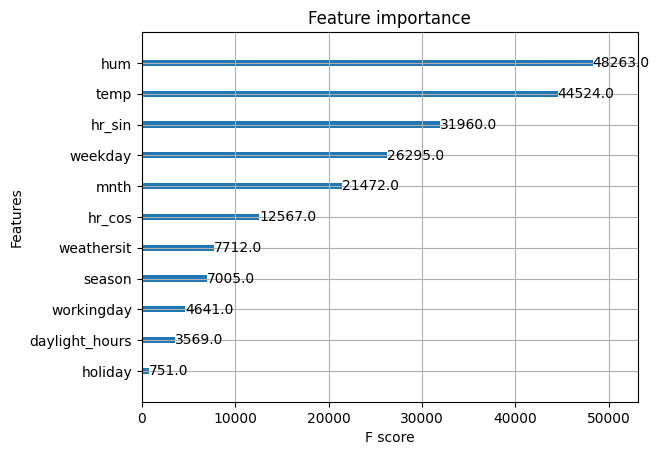

In [25]:
from xgboost import plot_importance
best_xgb_model = random_search_xgb.best_estimator_

# Plot feature importance
plot_importance(best_xgb_model)
plt.show()

#### Random Forest Model

In [26]:
from sklearn.ensemble import RandomForestRegressor

# Initialize the RandomForestRegressor
model_rf = RandomForestRegressor(random_state=0)

# Define the parameter grid for Random Forest
param_distributions = {
    'n_estimators': [100, 200],  
    'max_depth': [10, 20, 40, 80],      
    'min_samples_split': [10, 20], 
    'min_samples_leaf': [10, 20],   
    'max_features': ['sqrt', 'log2'] 
}

param_distributions = {
    'n_estimators': [100, 200, 400],  
    'max_depth': [20, 80, 120],      
    'min_samples_split': [2, 5, 10, 20, 50], 
    'min_samples_leaf': [2, 5, 10, 20, 50],   
    'max_features': ['sqrt', 'log2'] 
}


# Define the scorer
mape_scorer = make_scorer(metric, greater_is_better=False)

# Set up RandomizedSearchCV
random_search_rf = RandomizedSearchCV(
    estimator=model_rf,
    param_distributions=param_distributions,
    n_iter=30,  
    scoring=mape_scorer,
    cv=TimeSeriesSplit(n_splits=10),  
    verbose=1,
    random_state=0,
    refit=True,               
    n_jobs=-1,                
    return_train_score=True,
)

# Run the random search
random_search_rf.fit(X_train, y_train)

Fitting 10 folds for each of 30 candidates, totalling 300 fits


RandomizedSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=10, test_size=None),
                   estimator=RandomForestRegressor(random_state=0), n_iter=30,
                   n_jobs=-1,
                   param_distributions={'max_depth': [20, 80, 120],
                                        'max_features': ['sqrt', 'log2'],
                                        'min_samples_leaf': [2, 5, 10, 20, 50],
                                        'min_samples_split': [2, 5, 10, 20, 50],
                                        'n_estimators': [100, 200, 400]},
                   random_state=0, return_train_score=True,
                   scoring=make_scorer(mean_absolute_percentage_error, greater_is_better=False),
                   verbose=1)

In [42]:
best_model_params_rf = random_search_rf.best_params_
best_model_params_rf

{'n_estimators': 200,
 'min_samples_split': 2,
 'min_samples_leaf': 2,
 'max_features': 'log2',
 'max_depth': 20}

In [28]:
results = pd.DataFrame(random_search_rf.cv_results_)
results.T

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
mean_fit_time,1.411225,0.740669,1.698422,3.208236,9.920388,3.915163,0.974033,0.92569,4.012204,4.894729,...,3.577373,4.127333,4.209224,4.955212,1.640846,2.168868,1.037423,1.714222,3.118375,0.817967
std_fit_time,0.625633,0.334589,0.945848,1.487873,5.255893,1.747477,0.444693,0.400457,1.72243,2.516278,...,1.725359,2.021298,1.602653,2.131046,0.783583,1.00044,0.367958,0.705679,1.136684,0.29728
mean_score_time,0.04208,0.024257,0.053905,0.107338,0.15519,0.112049,0.025165,0.028576,0.123816,0.082482,...,0.114632,0.113726,0.118474,0.129615,0.055413,0.06024,0.032043,0.05393,0.0923,0.032917
std_score_time,0.010116,0.009398,0.016747,0.028157,0.040813,0.033104,0.010376,0.006616,0.03787,0.01819,...,0.041536,0.03493,0.022656,0.030887,0.019607,0.011853,0.005887,0.011149,0.013907,0.014868
param_n_estimators,200,100,200,400,400,400,100,100,400,200,...,400,400,400,400,200,200,100,200,400,100
param_min_samples_split,5,20,50,10,5,50,50,5,2,2,...,5,50,50,10,20,50,2,20,50,5
param_min_samples_leaf,20,20,10,50,2,20,2,20,20,2,...,50,5,10,10,50,2,20,50,50,50
param_max_features,log2,sqrt,log2,log2,log2,log2,sqrt,log2,log2,log2,...,sqrt,sqrt,log2,log2,log2,log2,sqrt,sqrt,sqrt,sqrt
param_max_depth,20,20,80,80,80,20,20,120,80,20,...,120,80,120,20,80,120,120,80,80,80
params,"{'n_estimators': 200, 'min_samples_split': 5, ...","{'n_estimators': 100, 'min_samples_split': 20,...","{'n_estimators': 200, 'min_samples_split': 50,...","{'n_estimators': 400, 'min_samples_split': 10,...","{'n_estimators': 400, 'min_samples_split': 5, ...","{'n_estimators': 400, 'min_samples_split': 50,...","{'n_estimators': 100, 'min_samples_split': 50,...","{'n_estimators': 100, 'min_samples_split': 5, ...","{'n_estimators': 400, 'min_samples_split': 2, ...","{'n_estimators': 200, 'min_samples_split': 2, ...",...,"{'n_estimators': 400, 'min_samples_split': 5, ...","{'n_estimators': 400, 'min_samples_split': 50,...","{'n_estimators': 400, 'min_samples_split': 50,...","{'n_estimators': 400, 'min_samples_split': 10,...","{'n_estimators': 200, 'min_samples_split': 20,...","{'n_estimators': 200, 'min_samples_split': 50,...","{'n_estimators': 100, 'min_samples_split': 2, ...","{'n_estimators': 200, 'min_samples_split': 20,...","{'n_estimators': 400, 'min_samples_split': 50,...","{'n_estimators': 100, 'min_samples_split': 5, ..."


In [29]:
y_pred_rf = random_search_rf.predict(X_future)

mape_rf = metric(y_future, y_pred_rf)

print("MAPE for Random Forest:", mape_rf)

MAPE for Random Forest: 1.0487921464759857


#### Linear Regression

In [47]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score, TimeSeriesSplit

# Initialize the LinearRegression model
model_lr = LinearRegression()

# Fit the model on your training data
model_lr.fit(X_train, y_train)

# perform cross-validation to evaluate the model
cv = TimeSeriesSplit(n_splits=5)
cv_scores = cross_val_score(model_lr, X, y, cv=cv, scoring=make_scorer(metric, greater_is_better=False))

print("Cross-validated MAPE scores:", cv_scores)
print("Mean CV MAPE:", abs(cv_scores.mean()))

# Predict on the future data
y_pred_lr = model_lr.predict(X_future)

# Calculate MAPE for Linear Regression
mape_lr = metric(y_future, y_pred_lr)
print("\nMAPE for Linear Regression:", mape_lr)

Cross-validated MAPE scores: [-3.29670881 -2.58335002 -2.12610172 -1.46203193 -1.55392368]
Mean CV MAPE: 2.20442323302806

MAPE for Linear Regression: 5.698477583598928


In [58]:
abs_xgb = abs(random_search_xgb.best_score_)
abs_rf = abs(random_search_rf.best_score_)
abs_lr = abs(mape_lr)

print("MAPE summary for the test:")
print(f"MAPE for XGBoost: {abs_xgb:.3f}")
print(f"MAPE for Random Forest: {abs_rf:.3f} ")
print(f"MAPE for Linear Regression: {abs_lr:.3f} \n")

print("MAPE summary for the last 7 days prediction:")
print("MAPE for XGBoost: {:.3f} ".format(mape_xgb))
print("MAPE for Random Forest: {:.3f} ".format(mape_rf))
print("MAPE for Linear Regression: {:.3f} ".format(mape_lr))

MAPE summary for the test:
MAPE for XGBoost: 0.510
MAPE for Random Forest: 0.723 
MAPE for Linear Regression: 5.698 

MAPE summary for the last 7 days prediction:
MAPE for XGBoost: 0.844 
MAPE for Random Forest: 1.049 
MAPE for Linear Regression: 5.698 


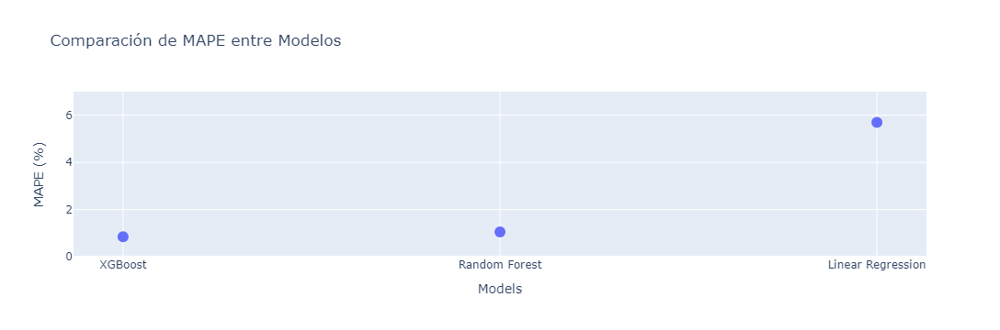

In [53]:
fig = go.Figure(data=[
    go.Scatter(
        x=['XGBoost', 'Random Forest', 'Linear Regression'],
        y=[mape_xgb, mape_rf, mape_lr],
        mode='markers',
        marker=dict(size=12)
    )
])

fig.update_layout(
    title='Comparación de MAPE entre Modelos',
    xaxis_title='Models',
    yaxis_title='MAPE (%)',
    yaxis=dict(range=[0, 7])
)

fig.show()


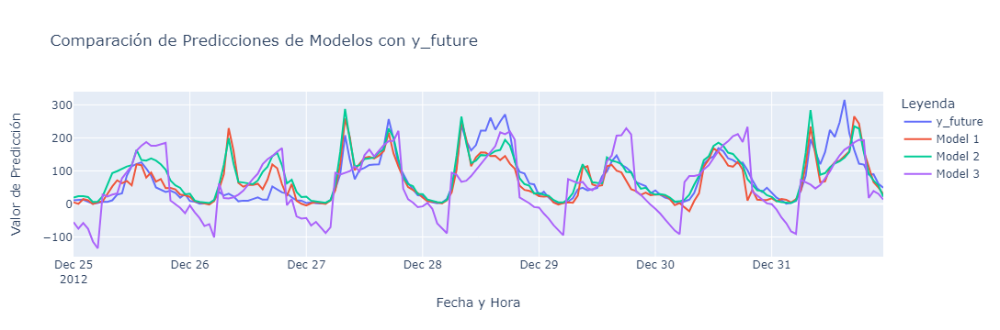

In [54]:
end_time = pd.Timestamp('2012-12-31 23:00:00')
start_time = end_time - pd.Timedelta(hours=167)
date_range = pd.date_range(start=start_time, end=end_time, freq='H')

y_cas_future = y_test[-168:]

fig = go.Figure()

fig.add_trace(go.Scatter(x=date_range, y=y_future, mode='lines', name='y_future'))

fig.add_trace(go.Scatter(x=date_range, y=y_pred, mode='lines', name='Model 1'))
fig.add_trace(go.Scatter(x=date_range, y=y_pred_rf, mode='lines', name='Model 2'))
fig.add_trace(go.Scatter(x=date_range, y=y_pred_lr, mode='lines', name='Model 3'))

fig.update_layout(title='Comparación de Predicciones de Modelos con y_future',
                  xaxis_title='Fecha y Hora',
                  yaxis_title='Valor de Predicción',
                  legend_title='Leyenda')

fig.show()

#### Exhaustive GridSearchCV for the XGBoost model

In [ ]:
# from xgboost import XGBRegressor
# from sklearn.metrics import mean_squared_error, make_scorer
# from sklearn.model_selection import RandomizedSearchCV, cross_val_score, train_test_split, GridSearchCV, TimeSeriesSplit
# from sklearn.metrics import mean_absolute_percentage_error as metric

In [ ]:
# from sklearn.metrics import mean_absolute_percentage_error


# # Assuming you've already prepared 'X' (features) and 'y' (target)
# # If not, prepare them according to your dataset
# features = ['yr', 'hr', 'temp', 'atemp', 'hum', 'casual', 'registered', 'daylight_hours', 'high_humidity', 'temp_squared', 'rolling_avg_cnt']
# X = data[features]
# y = data['cnt']

# # Split the data into training and testing sets
# perc_values = [0.7, 0.15, 0.15];
# X_train, X_valtest, y_train, y_valtest = train_test_split(X, y, test_size=perc_values[1] + perc_values[2], random_state=1);
# X_val, X_test, y_val, y_test = train_test_split(X_valtest, y_valtest, test_size= perc_values[2] / (perc_values[1] + perc_values[2]), random_state=1)

# # Xgboost
# n_estimators_values = [10, 100]
# learning_rate_values = [0.3, 0.99]
# gamma_values = [0, 1]
# max_depth_values = [6, 20]
# min_child_weight_values = [1, 20]
# subsample_values = [0.1, 1]
# colsample_bytree_values = [0.1, 1]
# num_parallel_tree_values = [1, 20]
# reg_lambda_values = [0, 1]
# reg_alpha_values = [0, 1]

# params_grid = {'n_estimators': n_estimators_values,
#                   'learning_rate': learning_rate_values,
#                  'gamma': gamma_values,
#                  'max_depth': max_depth_values,
#                  'min_child_weight': min_child_weight_values,
#                  'subsample': subsample_values,
#                  'colsample_bytree': colsample_bytree_values,
#                  'num_parallel_tree': num_parallel_tree_values,
#                  'reg_lambda': reg_lambda_values,
#                  'reg_alpha': reg_alpha_values}

In [ ]:
# from xgboost import XGBRegressor as model_constructor
# from sklearn.metrics import mean_absolute_percentage_error as metric
# from sklearn.metrics import make_scorer
# from sklearn.model_selection import GridSearchCV
# import numpy as np;
# import pandas as pd

# from timeit import default_timer



# grid_cv = GridSearchCV(model_constructor(),
#                      param_grid=params_grid,
#                      n_jobs=-1, ## Paralellization!
#                      cv = 5, # Number of folds
#                      scoring = make_scorer(metric, greater_is_better=False)) # Important!!!

# # Run grid
# start_time = default_timer()

# grid_cv.fit(np.concatenate((X_train, X_val), axis = 0), np.concatenate((y_train, y_val), axis = 0))

# stop_time = default_timer()
# print('CV Grid Search Total Computational Time: : ', stop_time - start_time)

In [ ]:
# results = grid_cv.cv_results_
# results = pd.DataFrame(results)
# results.T

In [ ]:
# grid_cv.best_params_

In [ ]:
# grid_cv.best_score_

## PART III: Streamlit dashboard

In [65]:
### This part goes in a separate script ###

In [44]:
import joblib


best_model_xgb = random_search_xgb.best_estimator_
joblib.dump(best_model_xgb, 'best_model_xgb_2.joblib')

['best_model_xgb_2.joblib']

In [45]:
import json

model_params = best_model_xgb.get_params()
with open('best_model_xgb_2.json', 'w') as json_file:
    json.dump(model_params, json_file)

In [46]:
import json
import numpy as np

y_pred_list = y_pred.tolist()

y_pred_string = json.dumps(y_pred_list)

# Write to file
with open('y_pred.json', 'w') as file:
    file.write(y_pred_string)

In [55]:
y_pred_rf_list = y_pred_rf.tolist()

y_pred_rf_string = json.dumps(y_pred_rf_list)

# Write to file
with open('y_pred_rf.json', 'w') as file:
    file.write(y_pred_rf_string)

In [56]:
import joblib


best_model_params_rf = random_search_rf.best_estimator_
joblib.dump(best_model_params_rf, 'best_model_rf.joblib')

['best_model_rf.joblib']

In [57]:
import json

model_params = best_model_params_rf.get_params()
with open('best_model_rf.json', 'w') as json_file:
    json.dump(model_params, json_file)

In [58]:
y_pred_lr_list = y_pred_lr.tolist()

y_pred_lr_string = json.dumps(y_pred_lr_list)

# Write to file
with open('y_pred_lr.json', 'w') as file:
    file.write(y_pred_lr_string)

In [38]:
!streamlit run Streamlit.py

^C


In [41]:
def plot_scatter_plotly(y_pred, y_future):
    # Assuming y_pred and y_future are lists and have the same length
        df = pd.DataFrame({'y_pred': y_pred, 'y_future': y_future})
        fig = px.scatter(df, x='y_pred', y='y_future', title='Scatter Plot of y_pred vs y_future')
        return fig

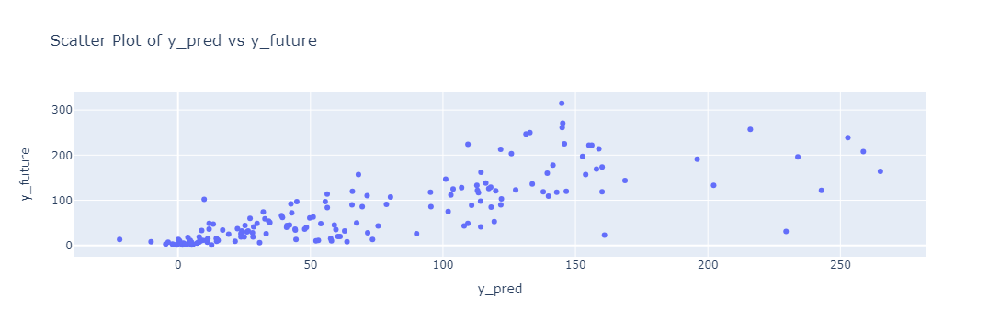

In [42]:
plot_scatter_plotly(y_pred, y_future)

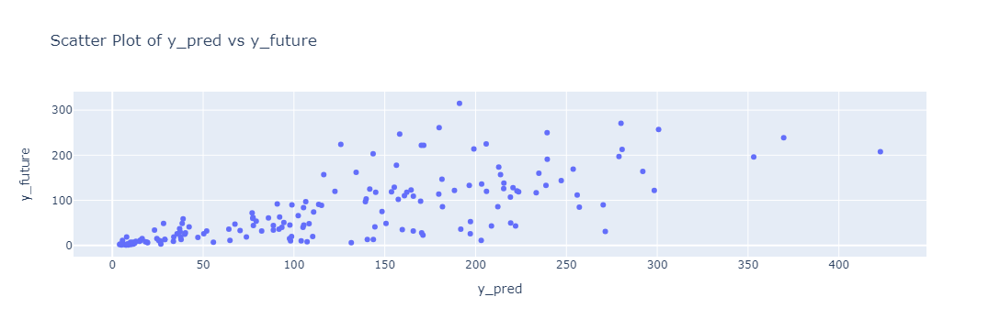

In [44]:
plot_scatter_plotly(y_pred_rf, y_future)